# Training a network on STEM data
In this notebook we will train a network on STEM data to recognize atoms in images. The scripts are collected at the end of the notebook.

## Setup
There are many different helper functions that we will import together with `pytorch` which we use to do the machine learrning.

In [1]:
# Load dependencies
# Base imports
import os
import sys
import time
import random

# Mount directories for local imports
module_path = os.path.abspath(os.path.join('../..'))
if module_path not in sys.path:
    sys.path.append(module_path)

# Imports
from torch.utils.data import DataLoader, Dataset, TensorDataset
from torchvision import utils
from torchvision import transforms as T
from torch.autograd import Variable
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
import torch

# Local imports
from helpers.models import create_model
from helpers.preprocessing import RandomResizedCrop, create_static_dataset, EllipticalGaussianBlur, STEMDataset, Normalize, GenerateImage, RandomRot, load_experimental_data, generate_dataset, load_data, generate_contamination_stack
from helpers.labels import create_labels
from helpers.processing import model_predict
from helpers.helpers import argparser
from helpers.fitting import show_wave, find_peaks

### Parameters
In this section we will define the different parameters that we will use throughout the notebook to train our model.

In [2]:
parameters = {
    "mode": "defects", # "atomspotter" or "defects" for additional functionality
    # Augmentation parameters
    "partial_threshold": 1, # must be 1 for atomspotter
    "dose": [10000.0, 500000.0], # eV
    "background_str": [0.0005, 0.005],  
    "contamination_str": [0, 0.4],
    "resize_size": (256, 256),
    "resize_scale": (0.8, 1.2),
    "resize_ratio": (0.9,1.2),
    # elliptical gaussian blur emulating drift correction artifacts
    "blur": [2, 4],

    "contamination_stack": None,
    # Network parameters
    "architecture": "unetplusplus",
    # Training parameters
    "debug": False, # prints GPU usage at each batch
    "epochs": 40,
    "lr": 0.0005,
    "N_augmentation": 40, # amount of augs. per im per epoch
    # Path parameters
    "save_path": "./data/model_weights/",
    "data_path": "./data/datasets/",
    # Losses from training for saving
    "train_loss": [],
    "val_loss": [],

    ## Lesser used options

    # Contamination
    "create_contamination": True,
    ## Contamination parameters
    "octaves": 8,
    "persistence": 0.5,

    # Label function
    ## To update the label function go to load_data definition
}

parameters = argparser(parameters)
parameters["save_name"] = parameters["architecture"]

### Additional function definitions
Here we will define a few functions that will help us throughout the notebook. Notice we define them here so we can change them and the change will propogate to all parts of the process.

In [3]:
# verbose print function
def vprint(txt, verbose=True):
    if verbose:
        print(txt, flush=True)

def prepare_data(parameters, dataname="dataset", verbose=True):
    # load dataset
    vprint(f"# Loading dataset in '{parameters['data_path']}'", verbose)
    features, labels, targets = load_data(parameters, dataname)
    vprint(f"Found dataset of shapes: \n    features: {list(features.shape)}\n    labels: {list(labels.shape)}", verbose)

    ## Change label function demonstrates how to update the label function
    change_label_function = False
    if change_label_function:
        vprint("# Updating labelling function (if chosen)", verbose)
        # import and use the labelling function you need
        ## Must be done manually
        # Remember to check that the correct targets are loaded
        # * for atomspotter mode the target is the samples
        # * for defects mode the target are the defect locations
        parameters["label_species"] = "2V-Br"
        parameters["label_sigma"] = 0.5
        parameters["label_type"] = "gauss"
        labels, label_names = create_labels(targets, parameters)
        parameters["label_names"] = label_names
        # current custom
        if parameters["label_species"]:
            i = (label_names==parameters["label_species"]).nonzero()[0][0]
            labels = labels[:,[i, -1],:,:]
    return features, labels

## Loading data
Here we load the datasets that are relevant both the training data and the static validation data which are saved in the specified directory. To create these datasets view `0) Generate data`. We can also specify a experimental image path to fetch images that we can perform predictions on during training - this gives insight into when we begin overfitting to our synthetic data.

In [4]:
# Load dataset and change labels if needed
print("## Loading datasets", flush=True)
features, labels = prepare_data(parameters)
print("## Loading validation set", flush=True)
val_features, val_labels = prepare_data(parameters, dataname="validation", verbose=False)
# Create contamination stacks
if parameters["create_contamination"]:
    print("Creating contamination stack", flush=True)
    contamination_stack = generate_contamination_stack(parameters, shape=parameters["resize_size"])
elif parameters["contamination_stack"]:
    contamination_stack = np.load(parameters["contamination_stack"], allow_pickle=True)["backgrounds"]
else:
    contamination_stack = None

## Loading datasets
# Loading dataset in './data/datasets/'
Found dataset of shapes: 
    features: [600, 480, 480]
    labels: [600, 5, 480, 480]
## Loading validation set
Creating contamination stack


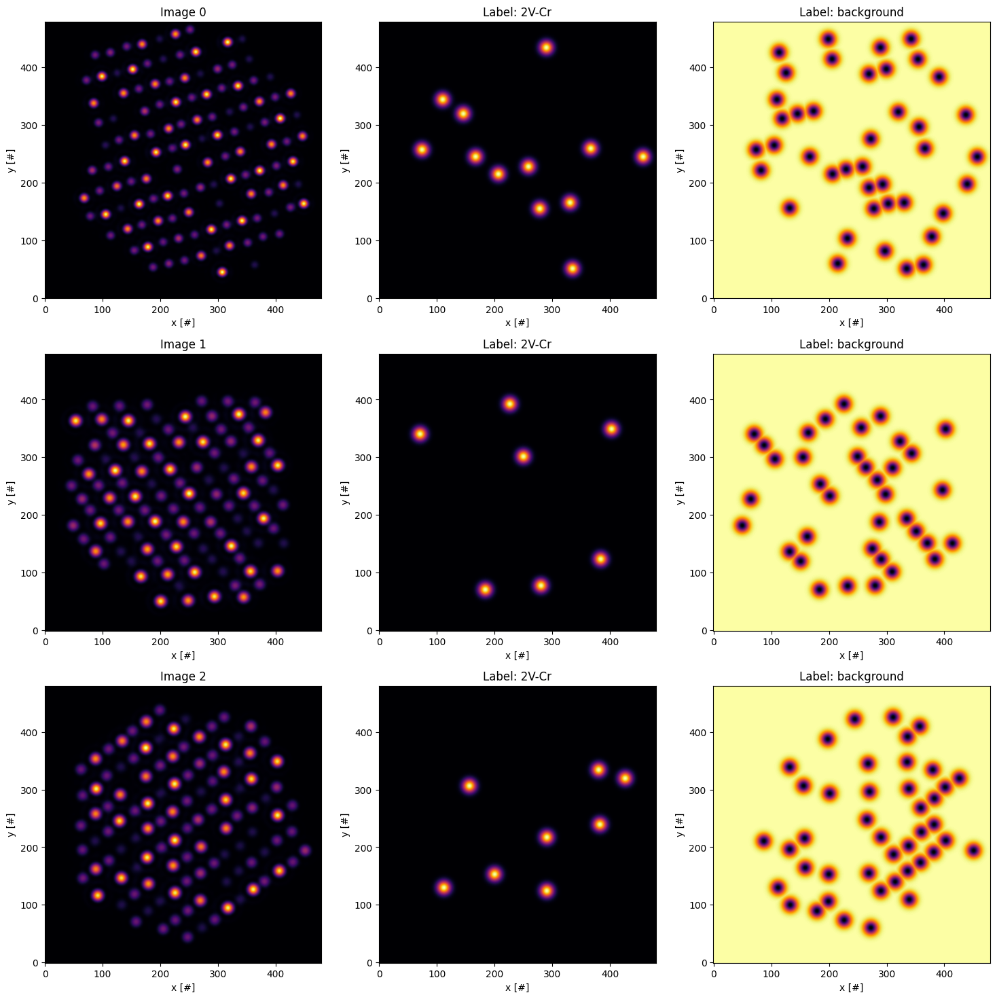

In [5]:
# Visualize the loaded data - training set
fig, axs = plt.subplots(3,3,figsize=(18,18))
channel = 1
for i in range(3):
    show_wave(features[i], ax=axs[i,0], title=f"Image {i}")
    show_wave(labels[i,channel], ax=axs[i,1], title=f"Label: {parameters['label_names'][channel]}")
    show_wave(labels[i,-1], ax=axs[i,2], title=f"Label: {parameters['label_names'][-1]}")

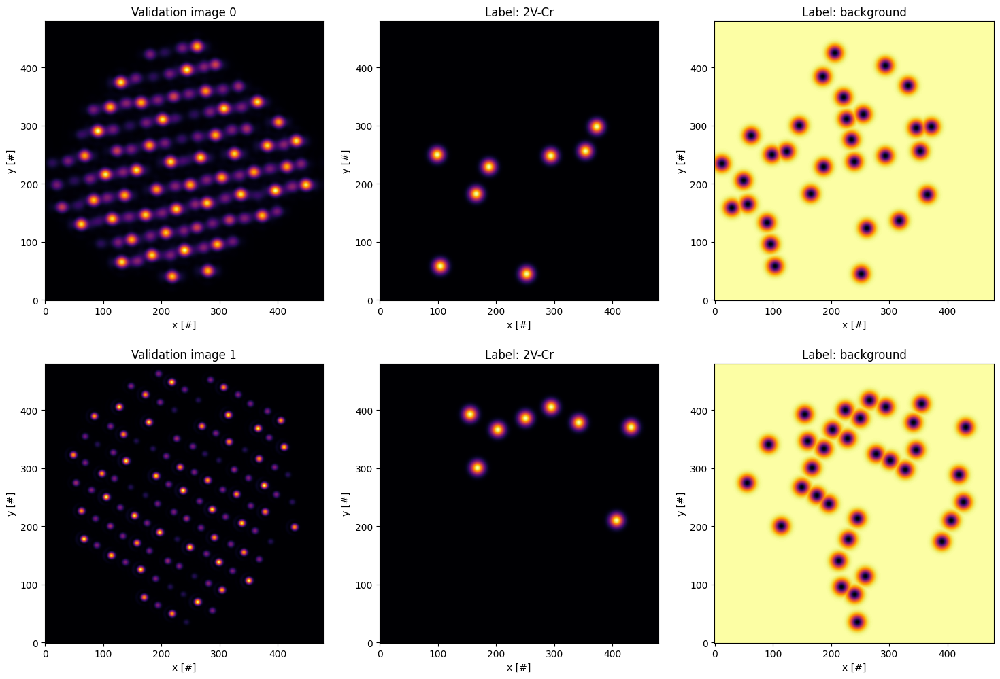

In [6]:
# Visualize the validation data
fig, axs = plt.subplots(2,3,figsize=(18,12))
channel = 1
for i in range(2):
    show_wave(val_features[i], ax=axs[i,0], title=f"Validation image {i}")
    show_wave(val_labels[i,channel], ax=axs[i,1], title=f"Label: {parameters['label_names'][channel]}")
    show_wave(val_labels[i,-1], ax=axs[i,2], title=f"Label: {parameters['label_names'][-1]}")

## Define transformation
Here we define the transformations we will use for our data augmentation.

In [7]:
# Define tranformations for data augmentation
generate_image = GenerateImage(dose=parameters["dose"],contamination_str=parameters["contamination_str"], background_str=parameters["background_str"],
                               contamination_stack=contamination_stack)
#scanjitter = ScanJitter(parameters["jitter_str"])
rotate = RandomRot([0, 90, 180, 270])
vflip = T.RandomVerticalFlip()
hflip = T.RandomHorizontalFlip()

composed = T.Compose([rotate, vflip, hflip])
composed_label = T.Compose([rotate, vflip, hflip])

kernel_size = [9,9]
if parameters["blur"]:
    blur = EllipticalGaussianBlur(kernel_size, parameters["blur"], parameters["blur"])
    composed = T.Compose([rotate, vflip, hflip, blur])
    composed_label = T.Compose([rotate, vflip, hflip, blur])

size = np.array(parameters["resize_size"])
scale = size/features.shape[1:]
scale *= parameters["resize_scale"]
crop = RandomResizedCrop(size=list(size),
    scale=list(scale), ratio=parameters["resize_ratio"])

normalization = Normalize()

### Create static validation set with the same augmentations
Since we can change the hyperparameters that perform the data augmentation we have to create a static validation dataset after we have defined the transformations

In [8]:
# Create static validation dataset
print("# Creating static validation set", flush=True)
val_features, val_labels = create_static_dataset(parameters, val_features, val_labels, composed, composed_label, generate_image, crop_resize=crop, normalize=normalization, partial_threshold=parameters["partial_threshold"])
print(f"Created validation set of shapes: \n    features: {list(val_features.shape)}\n    labels: {list(val_labels.shape)}", flush=True)


# Creating static validation set


/home/gridsan/mweile/2d-defect-detection/helpers/preprocessing.py:618: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.y = torch.tensor(y)


Created validation set of shapes: 
    features: [2000, 1, 256, 256]
    labels: [2000, 5, 256, 256]


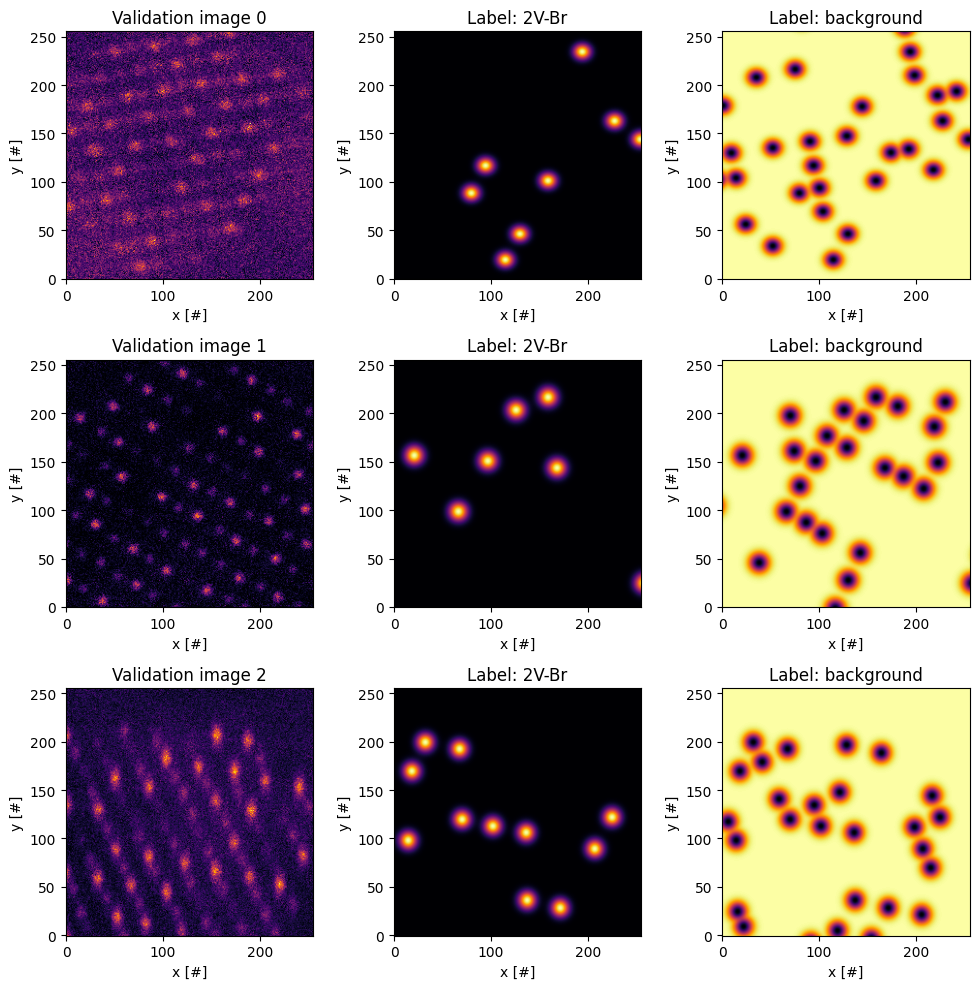

In [9]:
# Show the new static validation set
fig, axs = plt.subplots(3,3,figsize=(10,10))
channel = 0
for i in range(3):
    show_wave(np.array(val_features)[i], ax=axs[i,0], title=f"Validation image {i}")
    show_wave(np.array(val_labels)[i,channel], ax=axs[i,1], title=f"Label: {parameters['label_names'][channel]}")
    show_wave(np.array(val_labels)[i,-1], ax=axs[i,2], title=f"Label: {parameters['label_names'][-1]}")
plt.tight_layout()

In [10]:
# Create static training dataset
print("# Creating static training set", flush=True)
train_features, train_labels = create_static_dataset(parameters, features, labels, composed, composed_label, generate_image, crop_resize=crop, normalize=normalization, N_augmentations=parameters["N_augmentation"], partial_threshold=parameters["partial_threshold"])
print(f"Created training set of shapes: \n    features: {list(train_features.shape)}\n    labels: {list(train_labels.shape)}", flush=True)

# Creating static training set
Created training set of shapes: 
    features: [24000, 1, 256, 256]
    labels: [24000, 5, 256, 256]


/home/gridsan/mweile/2d-defect-detection/helpers/fitting.py:74: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matricesor `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2981.)
  image.T, extent=extent, cmap=cmap, origin="lower", vmax=vmax, **kwargs


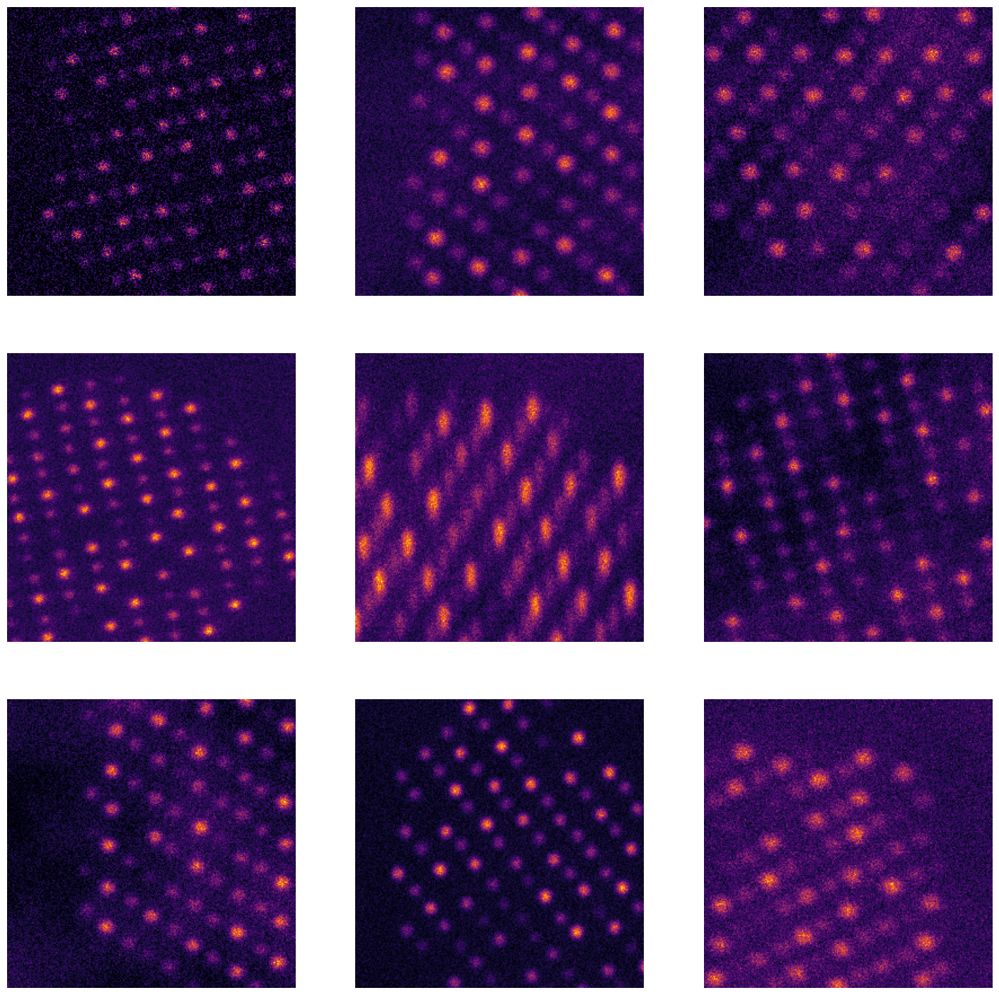

In [11]:
# Show 9 of the input images
fig, axs = plt.subplots(3,3,figsize=(18,18))
axs = axs.flatten()
for i in range(9):
    show_wave(train_features[i], ax=axs[i])
    axs[i].set_axis_off()

## Define loaders and setup for training
We are almost ready to train our neural network. The last step is setting up th remaining elements such as data loaders, save directory and the model.

In [12]:
# Define dataloaders
print("## Creating dataloaders", flush=True)
dataset = TensorDataset(train_features, train_labels)
val_dataset = TensorDataset(val_features, val_labels)
batch_size = 16
trainloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=20, drop_last=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=20, drop_last=True)

## Test that num classes specified matches found ones
assert  val_labels.shape[1] == labels.shape[1]
parameters["num_classes"] = labels.shape[1]
parameters["in_channels"] = 1
# check resize size on labels and features of validation set

## Find available save name
os.makedirs(parameters["save_path"], exist_ok=True)
# check model index (iterate so we do not overwrite finished models)
i = 0
while True:
    i +=  1
    if not os.path.isfile(parameters["save_path"]+parameters["save_name"]+f"_{i}"):
        parameters["save_name"] = parameters["save_name"] + f"_{i}"
        # Create empty file so we can run several experiments in parallel
        open(parameters["save_path"]+parameters["save_name"], 'a').close()
        break
print(f"## Using savename: {parameters['save_name']}")

## Define neural network
print("## Defining neural network", flush=True)
model = create_model(parameters["architecture"], parameters["in_channels"], parameters["num_classes"])

# Make cuda enabled
if torch.cuda.is_available():
    print("Converting network to cuda-enabled", flush=True)
    model.cuda()

# Define loss function
criterion = nn.MSELoss()
# Define optimizer
optimizer = optim.Adam(model.parameters(), lr=parameters["lr"])

## Creating dataloaders
## Using savename: unetplusplus_2
## Defining neural network
Converting network to cuda-enabled


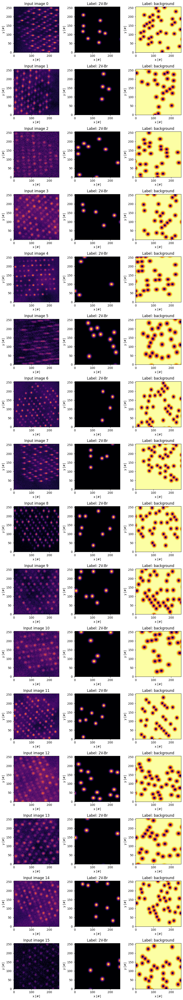

In [13]:
# Show some of the input features and corresponding labels
fig, axs = plt.subplots(batch_size,3,figsize=(9,batch_size*3))
channel = 0
for _, data in enumerate(trainloader, 0):
    inputs, labels = data
    for i in range(len(inputs)):
        show_wave(np.array(inputs)[i,0], ax=axs[i,0], title=f"Input image {i}")
        show_wave(np.array(labels)[i,channel], ax=axs[i,1], title=f"Label: {parameters['label_names'][channel]}")
        show_wave(np.array(labels)[i,-1], ax=axs[i,2], title=f"Label: {parameters['label_names'][-1]}")
    break
plt.tight_layout()

## Training the network
We can now train our network using the defined datasets and print the running loss during the process so we can monitor the model.

In [ ]:
i = 0
running_loss = 0.0
epochs = parameters["epochs"]
parameters["test_loss"] = []
parameters["train_loss"] = []
parameters["val_loss"] = []
parameters["peak_counts"] = []

print(f"## Training on {len(dataset)} samples ({parameters['N_augmentation']} per image) per epoch")
for epoch in range(epochs):  # loop over the dataset multiple times
    for _, data in enumerate(trainloader, 0):
        i += 1
        # get the inputs
        inputs, labels = data
        # wrap them in Variable
        inputs, labels = Variable(inputs).cuda(), Variable(labels).cuda()
        if parameters["debug"] == True:
            print(f"Memory usage (data): {((inputs.cpu().numpy().size+labels.cpu().numpy().size)/1e6):.2f} GB")

        # zero the parameter gradients
        optimizer.zero_grad()
        # forward + backward + optimize
        output = model(inputs)
        loss = criterion(output, labels)

        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()

    # Print status every epoch
    # Evaulate validation set
    val_loss = 0.0
    model.eval()
    for _, data in enumerate(val_loader, 0):
        inputs, labels = data
        output = model(inputs.cuda())
        val_loss += criterion(output, labels.cuda()).item()

    print(f'[{(epoch+1):02d}/{epochs}] Loss: {(running_loss/len(trainloader)):.5f} Val. loss: {(val_loss/len(val_loader)):.5f}', flush=True)
    parameters["val_loss"].append([(i+1)*batch_size, val_loss/len(val_loader)])
    parameters["train_loss"].append([(i+1)*batch_size, running_loss/200])
    running_loss = 0.0

    model.train()

print("Finished training", flush=True) # validation and save if epochs larger than 5 and better


In [ ]:
## Saving final model
print("## Saving the model", flush=True)
torch.save(model.state_dict(), parameters["save_path"]+parameters["save_name"])
np.save(parameters["save_path"]+parameters["save_name"]+"_pars.npy", parameters)

## Collected script

In [ ]:
# Load dependencies
# Base imports
import os
import sys
import time
import random

# Mount directories for local imports
module_path = os.path.abspath(os.path.join('../..'))
if module_path not in sys.path:
    sys.path.append(module_path)

# Imports
from torch.utils.data import DataLoader, Dataset, TensorDataset
from torchvision import utils
from torchvision import transforms as T
from torch.autograd import Variable
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
import torch

# Local imports
from helpers.models import create_model
from helpers.preprocessing import RandomResizedCrop, create_static_dataset, EllipticalGaussianBlur, STEMDataset, Normalize, GenerateImage, RandomRot, load_experimental_data, generate_dataset, load_data, generate_contamination_stack
from helpers.labels import create_labels
from helpers.processing import model_predict
from helpers.helpers import argparser
from helpers.fitting import show_wave, find_peaks

parameters = {
    "mode": "defects", # "atomspotter" or "defects" for additional functionality
    # Augmentation parameters
    "partial_threshold": 1, # must be 1 for atomspotter
    "dose": [10000.0, 500000.0],
    "background_str": [0.0005, 0.005],
    "contamination_str": [0, 0.4],
    "resize_size": (256, 256),
    "resize_scale": (0.8, 1.2),
    "resize_ratio": (0.9,1.2),
    # elliptical gaussian blur emulating drift correction artifacts
    "blur": [2, 4],

    "contamination_stack": None,
    # Network parameters
    "architecture": "unetplusplus",
    # Training parameters
    "debug": False, # prints GPU usage at each batch
    "epochs": 40,
    "lr": 0.0005,
    "N_augmentation": 40, # amount of augs. per im per epoch
    # Path parameters
    "save_path": "./data/model_weights/",
    "data_path": "./data/datasets/",
    # Losses from training for saving
    "train_loss": [],
    "val_loss": [],

    ## Lesser used options

    # Contamination
    "create_contamination": True,
    ## Contamination parameters
    "octaves": 8,
    "persistence": 0.5,

    # Label function
    ## To update the label function go to load_data definition
}

parameters = argparser(parameters)
parameters["save_name"] = parameters["architecture"]

parameters = argparser(parameters)
parameters["save_name"] = parameters["architecture"]

# verbose print function
def vprint(txt, verbose=True):
    if verbose:
        print(txt, flush=True)

def prepare_data(parameters, dataname="dataset", verbose=True):
    # load dataset
    vprint(f"# Loading dataset in '{parameters['data_path']}'", verbose)
    features, labels, targets = load_data(parameters, dataname)
    vprint(f"Found dataset of shapes: \\n    features: {list(features.shape)}\\n    labels: {list(labels.shape)}", verbose)

    ## Change label function
    change_label_function = True
    if change_label_function:
        vprint("# Updating labelling function (if chosen)", verbose)
        # import and use the labelling function you need
        ## Must be done manually
        # Remember to check that the correct targets are loaded
        # * for atomspotter mode the target is the samples
        # * for defects mode the target are the defect locations
        parameters["label_species"] = None
        parameters["label_sigma"] = 0.5
        parameters["label_type"] = "gauss"
        labels, label_names = create_labels(targets, parameters)
        parameters["label_names"] = label_names
        # current custom
        if parameters["label_species"]:
            i = (label_names==parameters["label_species"]).nonzero()[0][0]
            labels = labels[:,[i, -1],:,:]
    return features, labels

# Load dataset and change labels if needed
print("## Loading datasets", flush=True)
features, labels = prepare_data(parameters)
print("## Loading validation set", flush=True)
val_features, val_labels = prepare_data(parameters, dataname="validation", verbose=False)
# Create contamination stacks
if parameters["create_contamination"]:
    print("Creating contamination stack", flush=True)
    contamination_stack = generate_contamination_stack(parameters, shape=parameters["resize_size"])
elif parameters["contamination_stack"]:
    contamination_stack = np.load(parameters["contamination_stack"], allow_pickle=True)["backgrounds"]
else:
    contamination_stack = None

## Load in experimental data
print("# Loading experimental data", flush=True)
images, exp_targets = np.load('../test_data_peaks.npy', allow_pickle=True)
# choose only those zoomed out
mask = [0,1,2,5,7,8,9,10,11]
images, exp_targets = images[mask], exp_targets[mask]

# Define tranformations for data augmentation
generate_image = GenerateImage(dose=parameters["dose"],contamination_str=parameters["contamination_str"], background_str=parameters["background_str"],
                               contamination_stack=contamination_stack)
#scanjitter = ScanJitter(parameters["jitter_str"])
rotate = RandomRot([0, 90, 180, 270])
vflip = T.RandomVerticalFlip()
hflip = T.RandomHorizontalFlip()

composed = T.Compose([rotate, vflip, hflip])
composed_label = T.Compose([rotate, vflip, hflip])

size = np.array(parameters["resize_size"])
scale = size/features.shape[1:]
scale *= parameters["resize_scale"]
crop = RandomResizedCrop(size=list(size),
    scale=list(scale), ratio=parameters["resize_ratio"])

normalization = Normalize()



# Create validation dataset
print("# Creating static validation set", flush=True)
val_features, val_labels = create_static_dataset(parameters, val_features, val_labels, composed, composed_label, generate_image, crop_resize=crop, normalize=normalization, partial_threshold=parameters["partial_threshold"])
print(f"Created validation set of shapes: \\n    features: {list(val_features.shape)}\\n    labels: {list(val_labels.shape)}", flush=True)

# Create static training dataset
print("# Creating static training set", flush=True)
train_features, train_labels = create_static_dataset(parameters, features, labels, composed, composed_label, generate_image, crop_resize=crop, normalize=normalization, N_augmentations=parameters["N_augmentation"], partial_threshold=parameters["partial_threshold"])
print(f"Created training set of shapes: \\n    features: {list(train_features.shape)}\\n    labels: {list(train_labels.shape)}", flush=True)

# Define dataloaders
print("## Creating dataloaders", flush=True)
dataset = TensorDataset(train_features, train_labels)
val_dataset = TensorDataset(val_features, val_labels)
batch_size = 16
trainloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=20, drop_last=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=20, drop_last=True)

## Test that num classes specified matches found ones
assert  val_labels.shape[1] == labels.shape[1]
parameters["num_classes"] = labels.shape[1]
parameters["in_channels"] = 1
# check resize size on labels and features of validation set

## Find available save name
os.makedirs(parameters["save_path"], exist_ok=True)
# check model index (iterate so we do not overwrite finished models)
i = 0
while True:
    i +=  1
    if not os.path.isfile(parameters["save_path"]+parameters["save_name"]+f"_{i}"):
        parameters["save_name"] = parameters["save_name"] + f"_{i}"
        # Create empty file so we can run several experiments in parallel
        open(parameters["save_path"]+parameters["save_name"], 'a').close()
        break
print(f"## Using savename: {parameters['save_name']}")

## Define neural network
print("## Defining neural network", flush=True)
model = create_model(parameters["architecture"], parameters["in_channels"], parameters["num_classes"], encoder_weights = None)

# Make cuda enabled
if torch.cuda.is_available():
    print("Converting network to cuda-enabled", flush=True)
    model.cuda()

# Define loss function
criterion = nn.MSELoss()
# Define optimizer
optimizer = optim.Adam(model.parameters(), lr=parameters["lr"])


i = 0
running_loss = 0.0
threshold = 5
epochs = parameters["epochs"]
parameters["test_loss"] = []
parameters["train_loss"] = []
parameters["val_loss"] = []
parameters["peak_counts"] = []

print(f"## Training on {len(dataset)} samples ({parameters['N_augmentation']} per image) per epoch")
for epoch in range(epochs):  # loop over the dataset multiple times
    for _, data in enumerate(trainloader, 0):
        i += 1
        # get the inputs
        inputs, labels = data
        # wrap them in Variable
        inputs, labels = Variable(inputs).cuda(), Variable(labels).cuda()
        if parameters["debug"] == True:
            print(f"Memory usage (data): {((inputs.cpu().numpy().size+labels.cpu().numpy().size)/1e6):.2f} GB")

        # zero the parameter gradients
        optimizer.zero_grad()
        # forward + backward + optimize
        output = model(inputs)
        loss = criterion(output, labels)

        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()

    # Print status every epoch
    # Evaulate validation set
    val_loss = 0.0
    model.eval()
    for _, data in enumerate(val_loader, 0):
        inputs, labels = data
        output = model(inputs.cuda())
        val_loss += criterion(output, labels.cuda()).item()

    print(f'[{(epoch+1):02d}/{epochs}] Loss: {(running_loss/len(trainloader)):.5f} Val. loss: {(val_loss/len(val_loader)):.5f}', flush=True)
    parameters["val_loss"].append([(i+1)*batch_size, val_loss/len(val_loader)])
    parameters["train_loss"].append([(i+1)*batch_size, running_loss/200])
    running_loss = 0.0

    # evaluate on test data
    # figure out the amount of defects
    peak_count_all = np.zeros(parameters["num_classes"]-1)
    for k in range(len(images)):
        prediction = model_predict(images[k], model)
        for l in range(parameters["num_classes"]-1):
            peaks = find_peaks(prediction[0,l], threshold=0.8, min_dist=4)
            peak_count_all[l] += len(peaks)

    print(f"Peak count: {peak_count_all}", flush=True)
    parameters["peak_counts"].append(peak_count_all)
    model.train()

# At the end of epoch make a checkpoint
#save_checkpoint(model, parameters["save_name"], epoch, parameters["save_path"]+'checkpoints/')

print("Finished training", flush=True) # validation and save if epochs larger than 5 and better

# convert to arrays
parameters["train_loss"] = np.array(parameters["train_loss"])
parameters["val_loss"] = np.array(parameters["val_loss"])
parameters["peak_counts"] = np.array(parameters["peak_counts"])
parameters["test_loss"] = np.array(parameters["test_loss"])

## Saving final model
print("## Saving the model", flush=True)
torch.save(model.state_dict(), parameters["save_path"]+parameters["save_name"])
np.save(parameters["save_path"]+parameters["save_name"]+"_pars.npy", parameters)